In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import folium
from folium.plugins import HeatMap

#dataset: https://data.boston.gov/dataset/approved-building-permits

In [2]:
df = pd.read_csv('./permit_database.csv')
df.head()

,permitnumber,worktype,permittypedescr,description,comments,applicant,declared_valuation,total_fees,issued_date,expiration_date,...,occupancytype,sq_feet,address,city,state,zip,property_id,parcel_id,lat,long
0,A1000569,INTEXT,Amendment to a Long Form,Interior/Exterior Work,This work is to Amend Permit ALT347244. Elimin...,Patrick Sharkey,36500.00,390.0,2021-01-28 11:29:26,2021-07-28 00:00:00,...,Mixed,0.0,181-183 State ST,Boston,MA,02109,130392,0303807000,42.359190,-71.052924
1,A100071,COB,Amendment to a Long Form,City of Boston,Change connector link layout from attached enc...,Renee Santeusanio,40000.00,429.0,2011-11-04 11:04:58,2012-05-04 00:00:00,...,Comm,170.0,175 W Boundary RD,West Roxbury,MA,02132,17268,2012032000,42.260750,-71.149610
2,A1001012,OTHER,Amendment to a Long Form,Other,Amend Alt943748 to erect a roof deck as per pl...,Jusimar Oliveria,5000.00,70.0,2020-06-01 14:08:47,,...,1-3FAM,0.0,15 Prospect ST,Charlestown,MA,02129,113443,0202837000,42.375243,-71.057585
3,A1001201,INTEXT,Amendment to a Long Form,Interior/Exterior Work,Build steel balcony over garden level with sta...,Andreas Hwang,74295.75,803.0,2019-11-13 13:38:56,2020-05-13 00:00:00,...,Multi,0.0,211 W Springfield ST,Roxbury,MA,02118,129994,0402558000,42.340600,-71.080250
4,A100137,EXTREN,Amendment to a Long Form,Renovations - Exterior,Landscaping/stonework - amending permit #2801/...,NaN,15000.00,206.0,2013-01-03 14:13:09,2013-07-03 00:00:00,...,1-2FAM,0.0,14 William Jackson AVE,Brighton,MA,02135,149852,2204944000,42.344600,-71.154050


In [3]:
df.describe()

,declared_valuation,total_fees,sq_feet,lat,long
count,5.626000e+05,5.626000e+05,5.626000e+05,500177.000000,500177.000000
mean,2.106159e+05,4.121106e+03,1.954816e+04,42.327631,-71.085070
std,4.756784e+06,1.081881e+06,1.333234e+07,0.033762,0.035449
min,-1.000000e+06,-1.124260e+06,0.000000e+00,42.230380,-71.185680
25%,1.200000e+03,3.500000e+01,0.000000e+00,42.298810,-71.107710
50%,5.000000e+03,7.000000e+01,0.000000e+00,42.337559,-71.076360
75%,2.000000e+04,2.200000e+02,0.000000e+00,42.353000,-71.059128
max,1.831615e+09,6.250006e+08,1.000000e+10,42.395173,-70.994860


<AxesSubplot:>

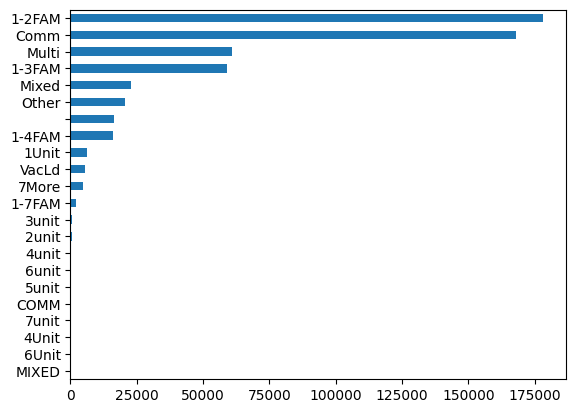

In [3]:
df.occupancytype.value_counts().sort_values().plot(kind = 'barh')

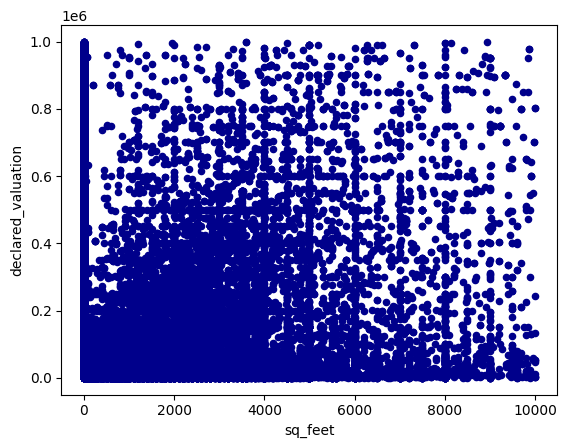

In [22]:
df_temp = df[df["declared_valuation"]<1000000]
df_temp = df_temp[df_temp["declared_valuation"]>0]
ax1 = df_temp[df_temp["sq_feet"]<10000].plot.scatter(x='sq_feet',y='declared_valuation', c='DarkBlue')

In [3]:
def fix_city_names(row):
    if type(row) != str:
        return "Unrecognized location(NOT_str)" 
    elif "west roxbury" in row.lower():
        return "West Roxbury"
    elif "west rox" in row.lower():
        return "West Roxbury"
    elif "roxbury" in row.lower():
        return "Roxbury"
    elif "ropxbury" in row.lower():
        return "Roxbury"
    elif "dorchester" in row.lower():
        return "Dorchester"
    elif "mattapan" in row.lower():
        return "Mattapan"
    elif "east boston" in row.lower():
        return "East Boston"
    elif "e boston" in row.lower():
        return "East Boston"
    elif "jamaica plain" in row.lower():
        return "Jamaica Plain"
    elif "south boston" in row.lower():
        return "South Boston"
    elif "roslindale" in row.lower():
        return "Roslindale"
    elif "brighton" in row.lower():
        return "Brighton"
    elif "hyde park" in row.lower():
        return "Hyde Park"
    elif "charlestown" in row.lower():
        return "Charlestown"
    elif "charleswtown" in row.lower():
        return "Charlestown"
    elif "mattapan" in row.lower():
        return "Mattapan"
    elif "allston" in row.lower():
        return "Allston"
    elif "mission hill" in row.lower():
        return "Mission Hill"
    elif "chestnut hill" in row.lower():
        return "Chestnut Hill"
    elif "financial district" in row.lower():
        return "Downtown"
    elif "downtown" in row.lower():
        return "Downtown"
    elif "south end" in row.lower():
        return "South End"
    elif "northend" in row.lower():
        return "North End"
    elif "north end" in row.lower():
        return "North End"
    elif "waterfront" in row.lower():
        return "Waterfront"
    elif "chinatown" in row.lower():
        return "Chinatown"
    elif "fenway" in row.lower():
        return "Fenway/Kenmore"
    elif "kenmore" in row.lower():
        return "Fenway/Kenmore"
    elif "west end" in row.lower():
        return "West End"
    elif "back bay" in row.lower():
        return "Back Bay"
    elif "back" in row.lower():
        return "Back Bay"
    elif "theater" in row.lower():
        return "Theater District"
    elif "beacon hill" in row.lower():
        return "Beacon Hill"
    elif "boston" in row.lower():
        return "Boston"
    else:
        return "Unrecognized location"

In [4]:
#cleaning
df = df[df['declared_valuation'] <= 50000000.0]
df = df[df['declared_valuation'] > 0.0]
df = df[df['total_fees'] < 50000.0]
df = df.loc[df.city.apply(type) != float]
df = df.loc[df["sq_feet"] < 1.0e+5]

df["city"] = df.city.apply(lambda x : x.replace(x, fix_city_names(x)))

In [40]:
#Unnormalized, non-inflation adjusted declared value heatmap
default_loc = [42.3601, -71.0589]
m = folium.Map(location=default_loc, zoom_start=10)

df['lat_long'] = list(zip(df.lat, df.long))
df = df[df['lat'].notna()] #drop NaN rows for lat long

heatmap_df = pd.DataFrame()
heatmap_df["lat"] = pd.Series(df["lat_long"].value_counts().keys()).str[0]
heatmap_df["long"] = pd.Series(df["lat_long"].value_counts().keys()).str[1]

heatmap_df["avg_valuation"] = pd.Series(df.groupby('lat_long')['declared_valuation'].mean().values)

HeatMap(heatmap_df, min_opacity = 0.4, blur = 18
       ).add_to(folium.FeatureGroup(name='Heat Map').add_to(m))
folium.LayerControl().add_to(m)

m

In [41]:
#Unnormalized, non-inflation adjusted fees heatmap
heatmap_df = pd.DataFrame()
heatmap_df["lat"] = pd.Series(df["lat_long"].value_counts().keys()).str[0]
heatmap_df["long"] = pd.Series(df["lat_long"].value_counts().keys()).str[1]

heatmap_df["avg_fees"] = pd.Series(df.groupby('lat_long')['total_fees'].mean().values)

HeatMap(heatmap_df, min_opacity = 0.4, blur = 18
       ).add_to(folium.FeatureGroup(name='Heat Map').add_to(m))
folium.LayerControl().add_to(m)

m

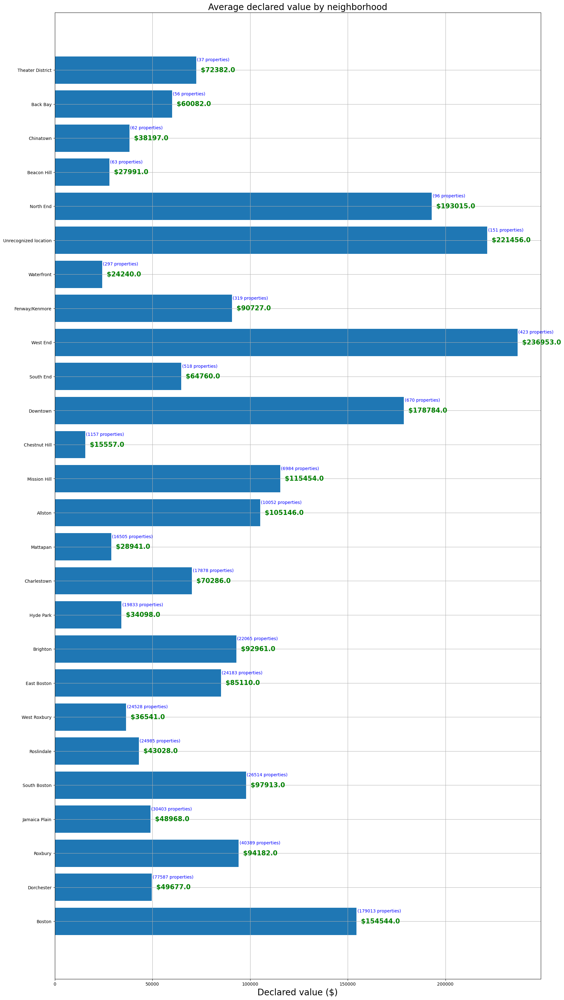

In [189]:
d = {} #this maps the neighborhood to the average declared_valuation

for x in df["city"].value_counts().keys():    
    d[x] = df[df["city"]==x]["declared_valuation"].mean()
    

names = list(d.keys())
values = list(d.values())
fig, ax = plt.subplots()
plt.rcParams["figure.figsize"] = (20,40)
ax.barh(range(len(d)), values, tick_label=names)

for i, v in enumerate(values):
    ax.text(v, i, "  "+"$"+str(np.round(v)), color='green', va='center', fontweight='bold', size = '15')
    ax.text(v+400, i+0.3, "("+str(df["city"].value_counts().values[i])+" properties)", color='blue', va='center', size = '10')


plt.title('Average declared value by neighborhood', fontsize = 20)
plt.xlabel('Declared value ($)', fontsize = 20)
plt.grid()
plt.show()

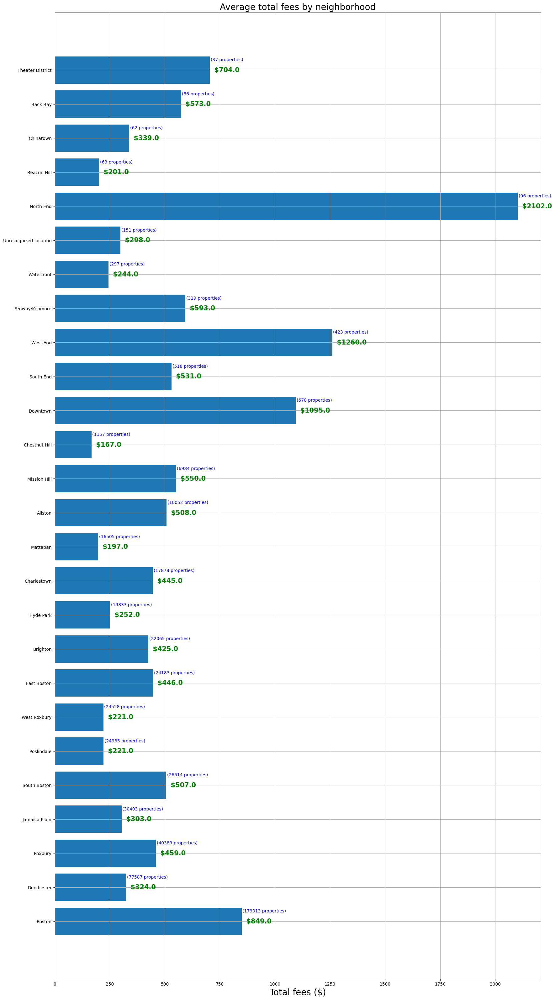

In [190]:
d = {} #this maps the neighborhood to the average declared_valuation

for x in df["city"].value_counts().keys():    
    d[x] = df[df["city"]==x]["total_fees"].mean()
    

names = list(d.keys())
values = list(d.values())
fig, ax = plt.subplots()
plt.rcParams["figure.figsize"] = (20,40)
ax.barh(range(len(d)), values, tick_label=names)

for i, v in enumerate(values):
    ax.text(v, i, "  "+"$"+str(np.round(v)), color='green', va='center', fontweight='bold', size = '15')
    ax.text(v+4, i+0.3, "("+str(df["city"].value_counts().values[i])+" properties)", color='blue', va='center', size = '10')


plt.title('Average total fees by neighborhood', fontsize = 20)
plt.xlabel('Total fees ($)', fontsize = 20)
plt.grid()
plt.show()

In [183]:
df["sq_feet"].describe()

count    5.261170e+05
mean     2.053162e+04
std      1.378684e+07
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+10
Name: sq_feet, dtype: float64

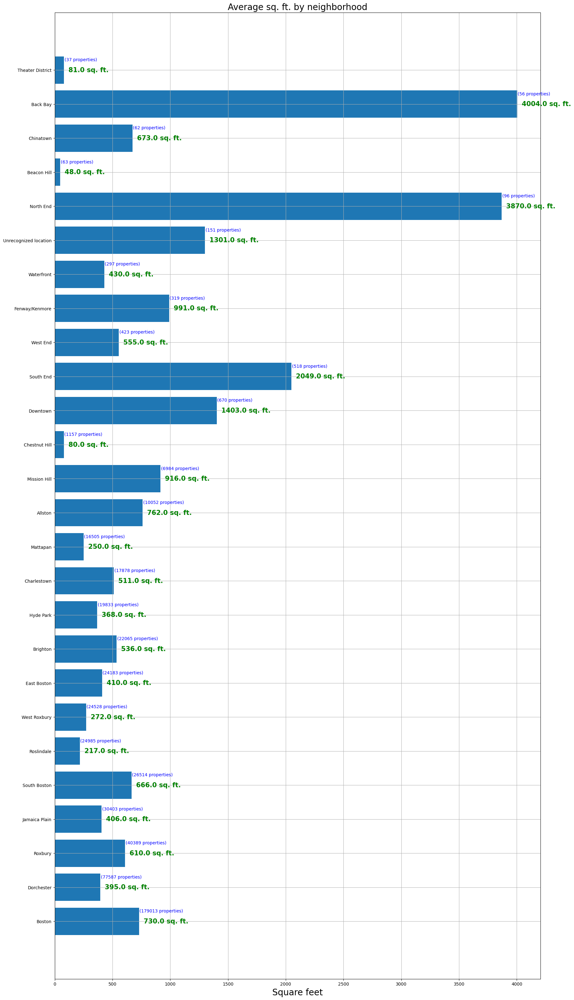

In [192]:
d = {} #this maps the neighborhood to the average declared_valuation

for x in df["city"].value_counts().keys():    
    d[x] = df[df["city"]==x]["sq_feet"].mean()
    

names = list(d.keys())
values = list(d.values())
fig, ax = plt.subplots()
plt.rcParams["figure.figsize"] = (20,40)
ax.barh(range(len(d)), values, tick_label=names)

for i, v in enumerate(values):
    ax.text(v, i, "  "+str(np.round(v))+" sq. ft.", color='green', va='center', fontweight='bold', size = '15')
    ax.text(v+4, i+0.3, "("+str(df["city"].value_counts().values[i])+" properties)", color='blue', va='center', size = '10')


plt.title('Average sq. ft. by neighborhood', fontsize = 20)
plt.xlabel('Square feet', fontsize = 20)
plt.grid()
plt.show()

<AxesSubplot:>

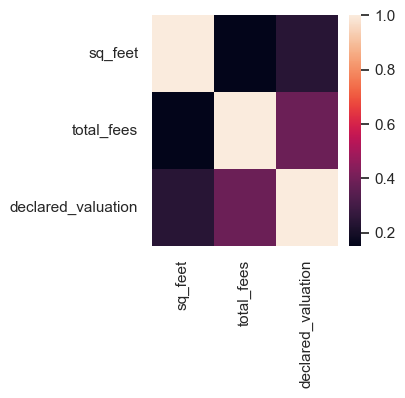

In [197]:
import seaborn as sns
sns.set(rc={'figure.figsize':(3,3)})
sns.heatmap(df[["sq_feet", "total_fees", "declared_valuation"]].corr())

In [209]:
df.applicant.value_counts()

ROBERT TRETHEWEY    4607
Richard Fallone     3474
MARK BROPHY         2844
John Guarracino     2244
Mark Traina         2220
                    ... 
michael  hopkins       1
FRANCIS HOPKINS        1
SAMUEL JUNTA           1
john baxter            1
Maria Dubrowski        1
Name: applicant, Length: 49711, dtype: int64

In [206]:
df.columns

Index(['permitnumber', 'worktype', 'permittypedescr', 'description',
       'comments', 'applicant', 'declared_valuation', 'total_fees',
       'issued_date', 'expiration_date', 'status', 'owner', 'occupancytype',
       'sq_feet', 'address', 'city', 'state', 'zip', 'property_id',
       'parcel_id', 'lat', 'long'],
      dtype='object')

In [8]:
#Unnormalized, non-inflation adjusted fees heatmap
default_loc = [42.3601, -71.0589]
m = folium.Map(location=default_loc, zoom_start=10)
df['lat_long'] = list(zip(df.lat, df.long))
df = df[df['lat'].notna()] #drop NaN rows for lat long

heatmap_df = pd.DataFrame()
heatmap_df["lat"] = pd.Series(df["lat_long"].value_counts().keys()).str[0]
heatmap_df["long"] = pd.Series(df["lat_long"].value_counts().keys()).str[1]

heatmap_df["avg_sq_feet"] = pd.Series(df.groupby('lat_long')['sq_feet'].mean().values)

HeatMap(heatmap_df, min_opacity = 0.4, blur = 18, gradient={.6: 'blue', .98: 'lime', 1: 'red'}
       ).add_to(folium.FeatureGroup(name='Heat Map').add_to(m))
folium.LayerControl().add_to(m)

m